Credit : @AUTHOR MOTO HIRA

Performing speech recognition using pre-trained models from wav2vec  2.0

1). Extract the acoustic features from audio waveform

2). Estimate the class of the acoustic features frame-by-frame

3). Generate hypothesis from the sequence of the class probabilities

In [1]:
import os 

import IPython
import matplotlib
import matplotlib.pyplot as plt
import requests
import torch
import torchaudio

matplotlib.rcParams["figure.figsize"] = [16.0, 4.8]

torch.random.manual_seed(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

SPEECH_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit/source-16k/train/sp0307/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav"  # noqa: E501
SPEECH_FILE = "_assets/speech.wav"

if not os.path.exists(SPEECH_FILE):
    os.makedirs("_assests", exist_ok=True)
    with open(SPEECH_FILE, "wb") as file:
        file.write(requests.get(SPEECH_URL).content)

# creating a pipeline

Create WAV2VEC2 Model to perform feature extraction and classification.

Wav2Vec2 two types: fine-tuned dfor ASR task and one the not fine-tuned.

first trained with audio for representation learning -> then fine-tuned for a specific task with addtitional labels.


In [2]:
bundle = torchaudio.pipelines.WAV2VEC2_ASR_LARGE_960H

print("Sample Rate:", bundle.sample_rate)

print("Labels:", bundle.get_labels())

Sample Rate: 16000
Labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


In [3]:
# fetch pre-trained weights and laod it into the model

model = bundle.get_model().to(device)

print(model.__class__)

Downloading: "https://download.pytorch.org/torchaudio/models/wav2vec2_fairseq_large_ls960_asr_ls960.pth" to /Users/amani/.cache/torch/hub/checkpoints/wav2vec2_fairseq_large_ls960_asr_ls960.pth
100.0%


<class 'torchaudio.models.wav2vec2.model.Wav2Vec2Model'>


In [4]:
# loading data

IPython.display.Audio(SPEECH_FILE)

In [5]:
waveform, sample_rate = torchaudio.load(SPEECH_FILE)
waveform = waveform.to(device)

if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

### feature extraction 

In [6]:
with torch.inference_mode():
    features, _ = model.extract_features(waveform)

returned features is a list of tensors, each tensor is the output of a transformer layer.

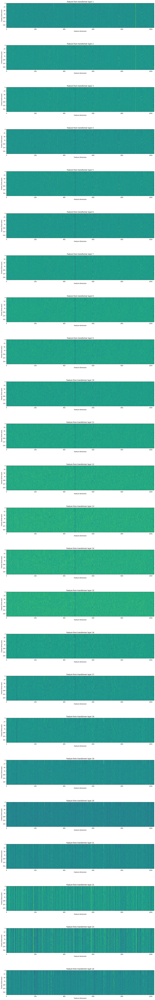

In [7]:
fig, ax = plt.subplots(len(features), 1, figsize=(16, 4.3 * len(features)))
for i, feats in enumerate(features):
    ax[i].imshow(feats[0].cpu())
    ax[i].set_title(f"Feature from transformer layer {i+1}")
    ax[i].set_xlabel("Feature dimension")
    ax[i].set_ylabel("Frame (time-axis)")

plt.tight_layout()
plt.show()

## feature classification


once acoustic features are extracted -> then they must be classified into set of categories

In [8]:
with torch.inference_mode():
    emission, _ = model(waveform)

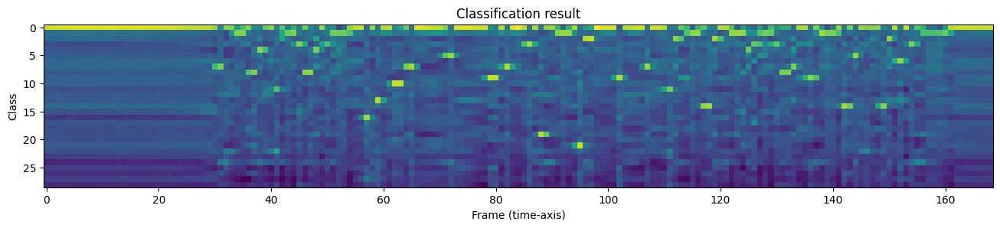

Class labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


In [9]:
# output in the form of logits.

plt.imshow(emission[0].cpu().T)
plt.title("Classification result")
plt.xlabel("Frame (time-axis)")
plt.ylabel("Class")
plt.show()
print("Class labels:", bundle.get_labels())

> strong indications to certain labels across the time line.

# Generating transcripts

Process of generating hypotheses is often called "decoding".

decoding more elaborate than simple classification as decoding at certain time steps can be affected by surroundinng observations.

for words with similar sound but different spelling decoding process has to postpone the final decision until it sees enough context.

for simplicity we perfomr greedy decoding.

In [10]:
class GreedyCTCDecoder(torch.nn.Module):
    def __init__(self, labels, blank=0):
        super().__init__()
        self.labels = labels
        self.blank = blank

    def forward(self, emission: torch.Tensor) -> str:
        """ Given a sequence emission over labels, get the best path string 
        Args:
            emission ( Tensor ): Logit tensors. Shape '[num_seq, num_label]'.

        Returns:
            str: The resulting transcript
        
        """
        
        indices = torch.argmax(emission, dim=-1) # [num_seq,]
        indices = torch.unique_consecutive(indices, dim=-1)
        indices = [i for i in indices if i != self.blank]
        return " ".join([self.labels[i] for i in indices])



In [11]:
decoder = GreedyCTCDecoder(labels=bundle.get_labels())
transcript = decoder(emission[0])

In [12]:
print(transcript)
IPython.display.Audio(SPEECH_FILE)

I | H A D | T H A T | C U R I O S I T Y | B E S I D E | M E | A T | T H I S | M O M E N T |


loss function Connectionist Temporal Classification (CTC)